# CNN for Image Classification

In [ ]:
import numpy as np
import keras
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.optimizers import SGD, Adam
from keras.preprocessing.image import ImageDataGenerator

from datetime import datetime
import keras.utils as image
import os, cv2
from google.colab.patches import cv2_imshow

%load_ext tensorboard

### Clone Github Dataset

In [ ]:
!git clone https://github.com/mesushan/CNN-for-image-Classification.git

!ls
# Clear any logs from previous runs
!rm -rf ./logs/

Cloning into 'CNN-for-image-Classification'...
remote: Enumerating objects: 10026, done.
remote: Counting objects: 100% (14/14), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 10026 (delta 0), reused 13 (delta 0), pack-reused 10012
Receiving objects: 100% (10026/10026), 216.96 MiB | 27.85 MiB/s, done.
Resolving deltas: 100% (1/1), done.
Checking out files: 100% (10007/10007), done.
CNN-for-image-Classification  sample_data


## Instantiate an Empty Model

In [ ]:
input_size = (64, 64)

model = Sequential()

model.add(Conv2D(filters=32, kernel_size=(3, 3), input_shape=(*input_size, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(filters=32, kernel_size=(3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(units=128, activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(units=1, activation='sigmoid'))

model.summary()

# Compile the model
model.compile(loss=keras.losses.binary_crossentropy, optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 62, 62, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 31, 31, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 29, 29, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 14, 14, 32)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 6272)              0         
                                                                 
 dense (Dense)               (None, 128)               8

### Fitting the CNN to the Images

In [ ]:
batch_size = 32

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

validation_datagen = ImageDataGenerator(rescale = 1./255)

# create training set
# wanna get higher accuracy -> inscrease target_size
training_set = train_datagen.flow_from_directory('/content/CNN-for-image-Classification/dataset/training_set',
                                                 target_size = input_size,
                                                 batch_size = batch_size,
                                                 class_mode = 'binary')

# create test set
# wanna get higher accuracy -> inscrease target_size
validation_set = validation_datagen.flow_from_directory('/content/CNN-for-image-Classification/dataset/test_set',
                                            target_size = input_size,
                                            batch_size = batch_size,
                                            class_mode = 'binary')

log_dir = "logs/" + datetime.now().strftime("%Y%m%d-%H%M%S")
log_writer = tf.summary.create_file_writer(log_dir)
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# fit the cnn model to the trainig set and testing it on the test set
model.fit(training_set,
          steps_per_epoch = 8000/batch_size,
          epochs = 30,
          validation_data = validation_set,
          validation_steps = 2000/batch_size,
          callbacks=[tensorboard_callback])

# Save weights and model
model.save_weights('./cnn_binary_weights.h5')

Found 8000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.
Epoch 1/30
250/250 [==============================] - 41s 128ms/step - loss: 0.6641 - accuracy: 0.5866 - val_loss: 0.6151 - val_accuracy: 0.6620
Epoch 2/30
250/250 [==============================] - 32s 129ms/step - loss: 0.5993 - accuracy: 0.6844 - val_loss: 0.5879 - val_accuracy: 0.6720
Epoch 3/30
250/250 [==============================] - 32s 127ms/step - loss: 0.5613 - accuracy: 0.7116 - val_loss: 0.5400 - val_accuracy: 0.7330
Epoch 4/30
250/250 [==============================] - 32s 130ms/step - loss: 0.5411 - accuracy: 0.7291 - val_loss: 0.5188 - val_accuracy: 0.7500
Epoch 5/30
250/250 [==============================] - 34s 133ms/step - loss: 0.5090 - accuracy: 0.7526 - val_loss: 0.4894 - val_accuracy: 0.7745
Epoch 6/30
250/250 [==============================] - 32s 127ms/step - loss: 0.4907 - accuracy: 0.7634 - val_loss: 0.4851 - val_accuracy: 0.7665
Epoch 7/30
250/250 [==========================

### Making Prediction

1/1 [==============================] - 0s 122ms/step
{'dogs': 0, 'cats': 1}
dog


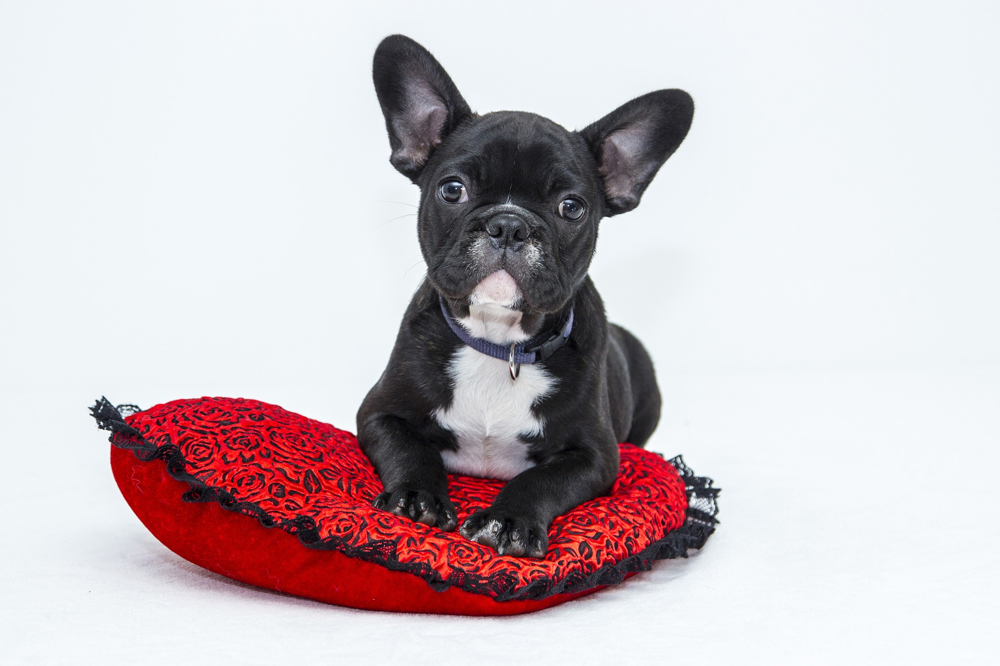

In [ ]:
model.load_weights('cnn_binary_weights.h5')

test_img_path = "/content/CNN-for-image-Classification/dataset/single_prediction/cat_or_dog_3.jpg"
test_image = image.load_img(test_img_path, target_size=input_size)
test_image = image.img_to_array(test_image)
test_image = np.expand_dims(test_image, axis=0)
prediction = model.predict(test_image)
print(training_set.class_indices)
label=""
if prediction == 0:
	label = 'cat'
if prediction == 1:
	label = 'dog'
print(label)

img = cv2.imread(test_img_path)
cv2_imshow(img) 

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>